In [1]:
using Distributions, CSV, DataFrames, StatPlots, StatsBase, MCMCChain, LinearAlgebra, Parameters, DataStructures

┌ Info: Precompiling StatPlots [60ddc479-9b66-56df-82fc-76a74619b69c]
└ @ Base loading.jl:1189


In [2]:
gr(fmt = :png)

Plots.GRBackend()

In [3]:
using Revise

In [115]:
using Rethinking

┌ Info: Precompiling Rethinking [d7c12e7a-c027-11e8-10fd-1349837b019b]
└ @ Base loading.jl:1189


In [116]:
ENV["LINES"] = 55

55

# Chapter 5

In [117]:
download("https://raw.githubusercontent.com/rmcelreath/rethinking/master/data/WaffleDivorce.csv", "WaffleDivorce.csv")

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  3189  100  3189    0     0  14832      0 --:--:-- --:--:-- --:--:-- 14832


"WaffleDivorce.csv"

In [118]:
waffle = CSV.read("WaffleDivorce.csv"; delim = ';', allowmissing = :none);

In [119]:
μ_MedianAgeMarriage, σ_MedianAgeMarriage = mean_and_std(waffle[:MedianAgeMarriage])
μ_Marriage, σ_Marriage = mean_and_std(waffle[:Marriage])

(20.114, 3.797905437775632)

In [120]:
waffle[:MedianAgeMarriageStd] = (waffle[:MedianAgeMarriage] .- μ_MedianAgeMarriage) / σ_MedianAgeMarriage;
waffle[:MarriageStd] = (waffle[:Marriage] .- μ_Marriage) / σ_Marriage;

In [121]:
waffle

,Location,Loc,Population,MedianAgeMarriage,Marriage,Marriage SE,Divorce,Divorce SE,WaffleHouses,South,Slaves1860,Population1860,PropSlaves1860,MedianAgeMarriageStd,MarriageStd
1,Alabama,AL,4.78,25.3,20.2,1.27,12.7,0.79,128,1,435080,964201,0.45,-0.60629,0.0226441
2,Alaska,AK,0.71,25.2,26.0,2.93,12.5,2.05,0,0,0,0,0.0,-0.686699,1.5498
3,Arizona,AZ,6.33,25.8,20.3,0.98,10.8,0.74,18,0,0,0,0.0,-0.204241,0.0489744
4,Arkansas,AR,2.92,24.3,26.4,1.7,13.5,1.22,41,1,111115,435450,0.26,-1.41039,1.65512
5,California,CA,37.25,26.8,19.1,0.39,8.0,0.24,0,0,0,379994,0.0,0.599857,-0.266989
6,Colorado,CO,5.03,25.7,23.5,1.24,11.6,0.94,11,0,0,34277,0.0,-0.284651,0.891544
7,Connecticut,CT,3.57,27.6,17.1,1.06,6.7,0.77,0,0,0,460147,0.0,1.24313,-0.793595
8,Delaware,DE,0.9,26.6,23.1,2.89,8.9,1.39,3,0,1798,112216,0.016,0.439037,0.786223
9,District of Columbia,DC,0.6,29.7,17.7,2.53,6.3,1.89,0,0,0,75080,0.0,2.93174,-0.635614
10,Florida,FL,18.8,26.4,17.0,0.58,8.5,0.32,133,1,61745,140424,0.44,0.278218,-0.819926


## Divorce ~ Median Mariage Age

In [122]:
struct LinModel1 <: Rethinking.Model
    σ_prior
    α_prior
    β1_prior
    d
end

In [123]:
link1(p, y) = p[2] .+ p[3] .* y

link1 (generic function with 1 method)

In [124]:
function (m::LinModel1)(p, y)
    logprior_σ = logpdf(m.σ_prior, p[1])
    logprior_α = logpdf(m.α_prior, p[2])
    logprior_β1 = logpdf(m.β1_prior, p[3])
    
    logprior = logprior_σ + logprior_α + logprior_β1
    
    if logprior === -Inf
        return logprior
    end
    
    μ = link1(p, y[:MedianAgeMarriageStd])
    
    dlike = Normal.(μ, p[1])
    loglike = sum(logpdf.(dlike, y[:Divorce]))
    
    loglike + logprior
end

In [125]:
m1 = LinModel1(
    Uniform(0, 10),
    Normal(10, 10),
    Normal(0, 1),
    waffle
);

In [126]:
dist1 = Rethinking.map(m1, [5.0, 10.0, 0.0])

FullNormal(
dim: 3
μ: [1.4464, 9.68813, -1.04293]
Σ: [0.0209581 3.78083e-6 0.00123758; 3.78083e-6 0.0418241 1.90414e-7; 0.00123758 1.90414e-7 0.0410203]
)


In [127]:
Rethinking.precis(dist1)

p        Mean      StdDev        5.5%       94.5%           1           2           3
1       1.446       0.145       1.215       1.678       1.000   1.277e-04   4.221e-02 
2       9.688       0.205       9.361      10.015   1.277e-04       1.000   4.597e-06 
3      -1.043       0.203      -1.367      -0.719   4.221e-02   4.597e-06       1.000 


In [128]:
μ = mean(dist1)
s = rand(dist1, 10000)';
ws = -2.4:0.1:3.1;

In [129]:
μs = [ link1([s[:,1], s[:,2], s[:,3]], w) for w in ws ];

In [130]:
μs_mean = map(mean, μs);

In [131]:
μs_hdpi = map(d -> MCMCChain.hpd(d, alpha=1-0.89), μs);

In [132]:
ys = [rand.(Normal.(link1([s[:,1], s[:,2], s[:,3]], w), s[:,1])) for w in ws];

In [133]:
yis = MCMCChain.hpd.(ys, alpha=1-0.89);

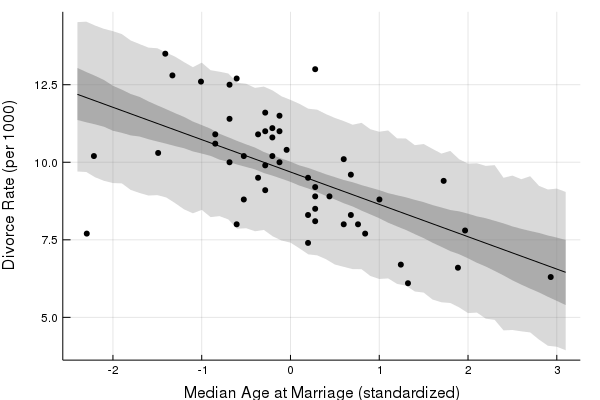

In [134]:
Plots.plot(ws, last.(yis), linealpha = 0.0, fill = (first.(yis), 0.3, :grey))
Plots.plot!(ws, last.(μs_hdpi), linealpha = 0.0, fill = (first.(μs_hdpi), 0.5, :grey))
Plots.plot!(ws, μs_mean, color = :black)
Plots.scatter!(waffle[:MedianAgeMarriageStd], waffle[:Divorce], m=(3.5, 1.0, :black, stroke(0)), legend = false)
ylabel!("Divorce Rate (per 1000)")
xlabel!("Median Age at Marriage (standardized)")

## Divorce ~ Mariage Rate

In [135]:
struct LinModel2 <: Rethinking.Model
    σ_prior
    α_prior
    β1_prior
    d
end

In [136]:
link2(p, y) = p[2] .+ p[3] .* y

link2 (generic function with 1 method)

In [137]:
function (m::LinModel2)(p, y)
    logprior_σ = logpdf(m.σ_prior, p[1])
    logprior_α = logpdf(m.α_prior, p[2])
    logprior_β1 = logpdf(m.β1_prior, p[3])
    
    logprior = logprior_σ + logprior_α + logprior_β1
    
    if logprior === -Inf
        return logprior
    end
    
    μ = link2(p, y[:MarriageStd])
    
    dlike = Normal.(μ, p[1])
    loglike = sum(logpdf.(dlike, y[:Divorce]))
    
    loglike + logprior
end

In [138]:
m2 = LinModel2(
    Uniform(0, 10),
    Normal(10, 10),
    Normal(0, 1),
    waffle
);

In [139]:
dist2 = Rethinking.map(m2, [5.0, 10.0, 0.0])

FullNormal(
dim: 3
μ: [1.67229, 9.68817, 0.643755]
Σ: [0.0279907 5.84685e-6 -0.00116346; 5.84685e-6 0.0559001 -1.82664e-7; -0.00116346 -1.82664e-7 0.0540397]
)


In [140]:
Rethinking.precis(dist2)

p        Mean      StdDev        5.5%       94.5%           1           2           3
1       1.672       0.167       1.405       1.940       1.000   1.478e-04  -2.991e-02 
2       9.688       0.236       9.310      10.066   1.478e-04       1.000  -3.323e-06 
3       0.644       0.232       0.272       1.015  -2.991e-02  -3.323e-06       1.000 


In [141]:
μ = mean(dist2)
s = rand(dist2, 10000)';
ws = -2.4:0.1:3.1;

In [142]:
μs = [ link2([s[:,1], s[:,2], s[:,3]], w) for w in ws];

In [143]:
μs_mean = map(mean, μs);

In [144]:
μs_hdpi = map(d -> MCMCChain.hpd(d, alpha=1-0.89), μs);

In [145]:
ys = [rand.(Normal.(link1([s[:,1], s[:,2], s[:,3]], w), s[:,1])) for w in ws];

In [146]:
yis = MCMCChain.hpd.(ys, alpha=1-0.89);

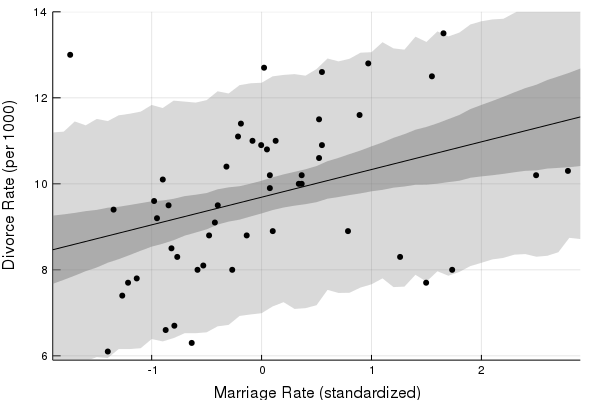

In [147]:
Plots.plot(ws, last.(yis), linealpha = 0.0, fill = (first.(yis), 0.3, :grey))
Plots.plot!(ws, last.(μs_hdpi), linealpha = 0.0, fill = (first.(μs_hdpi), 0.5, :grey))
Plots.plot!(ws, μs_mean, color = :black)
Plots.scatter!(waffle[:MarriageStd], waffle[:Divorce], m=(4.0, :black, stroke(0)), legend = false, xlims = (-1.9, 2.9), ylims = (5.9, 14.0))
ylabel!("Divorce Rate (per 1000)")
xlabel!("Marriage Rate (standardized)")

## Divorce ~ Mariage Rate + Median Mariage Age

In [148]:
struct LinModel3 <: Rethinking.Model
    σ_prior
    α_prior
    βR_prior
    βA_prior
    d
end

In [149]:
link3(p, y) = p[2] .+ p[3] .* y[:MarriageStd] .+ p[4] .* y[:MedianAgeMarriageStd] 

link3 (generic function with 1 method)

In [150]:
function (m::LinModel3)(p, y)
    logprior_σ = logpdf(m.σ_prior, p[1])
    logprior_α = logpdf(m.α_prior, p[2])
    logprior_βR = logpdf(m.βR_prior, p[3])
    logprior_βA = logpdf(m.βA_prior, p[4])
    
    logprior = logprior_σ + logprior_α + logprior_βR + logprior_βA
    
    if logprior === -Inf
        return logprior
    end
    
    μ = link3(p, y)
    
    dlike = Normal.(μ, p[1])
    loglike = sum(logpdf.(dlike, y[:Divorce]))
    
    loglike + logprior
end

In [151]:
m3 = LinModel3(
    Uniform(0, 10),
    Normal(10, 10),
    Normal(0, 1),
    Normal(0, 1),
    waffle
);

In [152]:
dist3 = Rethinking.map(m3, [5.0, 10.0, 0.0, 0.0])

FullNormal(
dim: 4
μ: [1.44005, 9.68813, -0.132171, -1.13475]
Σ: [0.0208358 3.73126e-6 0.00206707 0.00276335; 3.73126e-6 0.041458 3.7017e-7 4.94859e-7; 0.00206707 3.7017e-7 0.0780807 0.0541501; 0.00276335 4.94859e-7 0.0541501 0.0782421]
)


In [153]:
Rethinking.precis(dist3; names = ["σ", "α", "βR", "βA"])

p         Mean      StdDev        5.5%       94.5%           σ           α          βR          βA
σ        1.440       0.144       1.209       1.671       1.000   1.270e-04       0.051       0.068 
α        9.688       0.204       9.363      10.014   1.270e-04       1.000   6.506e-06   8.689e-06 
βR      -0.132       0.279      -0.579       0.314       0.051   6.506e-06       1.000       0.693 
βA      -1.135       0.280      -1.582      -0.688       0.068   8.689e-06       0.693       1.000 


## Mariage Rate ~ Median Mariage Age

In [154]:
struct LinModel4 <: Rethinking.Model
    σ_prior
    α_prior
    β_prior
    d
end

In [155]:
link4(p, y) = p[2] .+ p[3] .* y

link4 (generic function with 1 method)

In [156]:
function (m::LinModel4)(p, y)
    logprior_σ = logpdf(m.σ_prior, p[1])
    logprior_α = logpdf(m.α_prior, p[2])
    logprior_β = logpdf(m.β_prior, p[3])
    
    logprior = logprior_σ + logprior_α + logprior_β
    
    if logprior === -Inf
        return logprior
    end
    
    μ = link4(p, y[:MedianAgeMarriageStd])
    
    dlike = Normal.(μ, p[1])
    loglike = sum(logpdf.(dlike, y[:MarriageStd]))
    
    loglike + logprior
end

In [157]:
m4 = LinModel4(
    Uniform(0, 10),
    Normal(0, 10),
    Normal(0, 1),
    waffle
);

In [158]:
dist4 = Rethinking.map(m4, [5.0, 0.0, 0.0])

FullNormal(
dim: 3
μ: [0.685905, -7.40245e-12, -0.714238]
Σ: [0.00470558 2.10223e-9 9.31965e-5; 2.10223e-9 0.00940844 -4.29284e-9; 9.31965e-5 -4.29284e-9 0.00951189]
)


In [159]:
Rethinking.precis(dist4)

p        Mean      StdDev        5.5%       94.5%           1           2           3
1       0.686       0.069       0.576       0.796       1.000   3.159e-07   1.393e-02 
2  -7.402e-12       0.097      -0.155       0.155   3.159e-07       1.000  -4.538e-07 
3      -0.714       0.098      -0.870      -0.558   1.393e-02  -4.538e-07       1.000 


In [160]:
μ = mean(dist4);

In [161]:
ws = -2.4:0.1:3.1;

In [162]:
μs = [ link4(μ, w) for w in ws];

In [163]:
res = waffle[:MarriageStd] - link4(μ, waffle[:MedianAgeMarriageStd]);

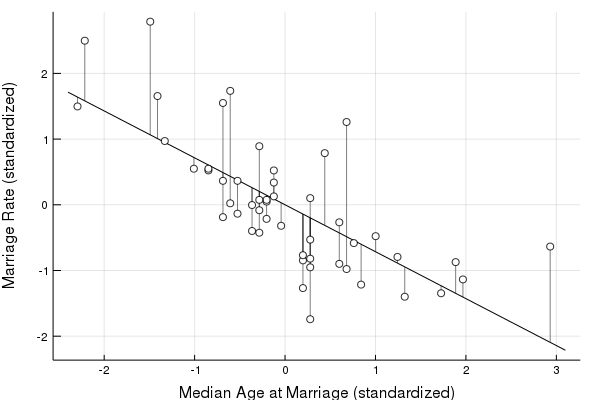

In [164]:
plot(ws, μs, color = :black)
for case in eachrow(waffle)
    x = case[:MedianAgeMarriageStd]
    y0 = link4(μ, x)
    y1 = case[:MarriageStd]
    plot!([x, x], [y0, y1], line = (0.5, 0.5, :black))
end
scatter!(waffle[:MedianAgeMarriageStd], waffle[:MarriageStd], legend = false, marker = (4.0, 1.0, :white, stroke(1.0, 0.8, :black)))
xlabel!("Median Age at Marriage (standardized)")
ylabel!("Marriage Rate (standardized)")

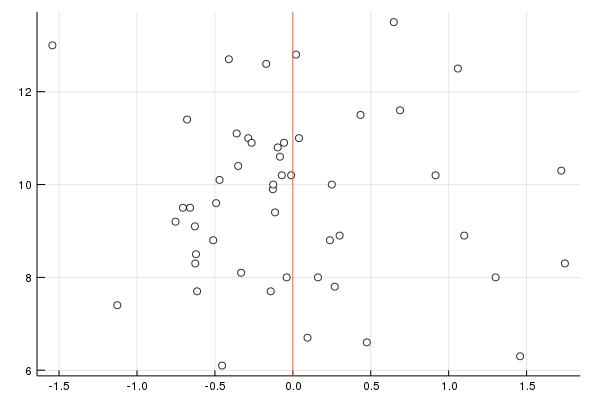

In [165]:
scatter(res, waffle[:Divorce], legend = false, marker = (4.0, 1.0, :white, stroke(1.0, 0.8, :black)))
vline!([0])

In [166]:
struct LinModel5 <: Rethinking.Model
    σ_prior
    α_prior
    β_prior
    d
end

In [167]:
link5(p, y) = p[2] .+ p[3] .* y

link5 (generic function with 1 method)

In [168]:
function (m::LinModel5)(p, y)
    logprior_σ = logpdf(m.σ_prior, p[1])
    logprior_α = logpdf(m.α_prior, p[2])
    logprior_β = logpdf(m.β_prior, p[3])
    
    logprior = logprior_σ + logprior_α + logprior_β
    
    if logprior === -Inf
        return logprior
    end
    
    μ = link5(p, y[:MarriageStd])
    
    dlike = Normal.(μ, p[1])
    loglike = sum(logpdf.(dlike, y[:MedianAgeMarriageStd]))
    
    loglike + logprior
end

In [169]:
m5 = LinModel5(
    Uniform(0, 10),
    Normal(0, 10),
    Normal(0, 1),
    waffle
);

In [170]:
dist5 = Rethinking.map(m5, [5.0, 0.0, 0.0])

FullNormal(
dim: 3
μ: [0.685905, -4.75173e-12, -0.714238]
Σ: [0.00470558 -4.20445e-9 9.31943e-5; -4.20445e-9 0.00940844 8.58569e-9; 9.31943e-5 8.58569e-9 0.00951189]
)


In [171]:
Rethinking.precis(dist5)

p        Mean      StdDev        5.5%       94.5%           1           2           3
1       0.686       0.069       0.576       0.796       1.000  -6.319e-07   1.393e-02 
2  -4.752e-12       0.097      -0.155       0.155  -6.319e-07       1.000   9.076e-07 
3      -0.714       0.098      -0.870      -0.558   1.393e-02   9.076e-07       1.000 


In [172]:
μ = mean(dist5);

In [173]:
ws = -2.4:0.1:3.1;

In [174]:
μs = [ link5(μ, w) for w in ws];

In [175]:
res = waffle[:MedianAgeMarriageStd] - link5(μ, waffle[:MarriageStd]);

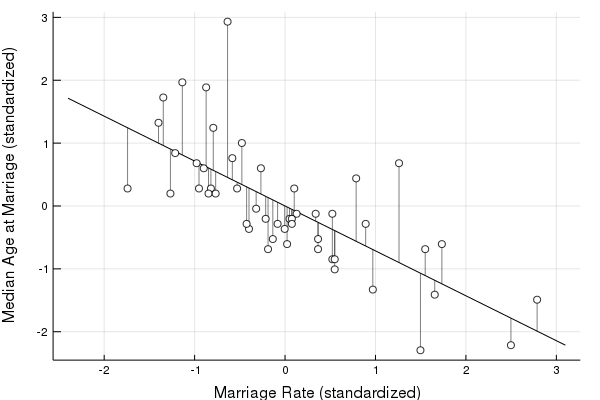

In [176]:
plot(ws, μs, color = :black)
for case in eachrow(waffle)
    x = case[:MarriageStd]
    y0 = link4(μ, x)
    y1 = case[:MedianAgeMarriageStd]
    plot!([x, x], [y0, y1], line = (0.5, 0.5, :black))
end
scatter!(waffle[:MarriageStd], waffle[:MedianAgeMarriageStd], legend = false, marker = (4.0, 1.0, :white, stroke(1.0, 0.8, :black)))
ylabel!("Median Age at Marriage (standardized)")
xlabel!("Marriage Rate (standardized)")

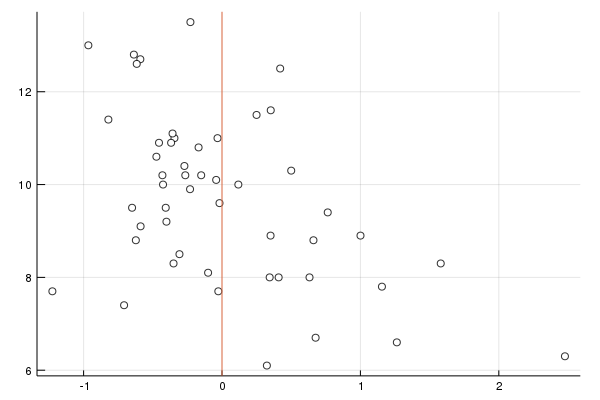

In [177]:
scatter(res, waffle[:Divorce], legend = false, marker = (4.0, 1.0, :white, stroke(1.0, 0.8, :black)))
vline!([0])

## Divorce ~ Mariage Rate

In [178]:
μ = mean(dist3);

In [179]:
s = rand(dist3, 50000)';

In [180]:
ws = -3.0:0.1:3.0;

In [181]:
μs = [ link3([s[:,1], s[:,2], s[:,3], s[:,4]], (MedianAgeMarriageStd = 0.0, MarriageStd = w)) for w in ws ];

In [182]:
μs_mean = map(mean, μs);

In [183]:
μs_hdpi = map(d -> MCMCChain.hpd(d, alpha=1-0.89), μs);

In [184]:
ys = [ rand.(Normal.(link3([s[:,1], s[:,2], s[:,3], s[:,4]], (MedianAgeMarriageStd = 0.0, MarriageStd = w)), s[:,1])) for w in ws ];

In [185]:
yis = MCMCChain.hpd.(ys, alpha=1-0.89);

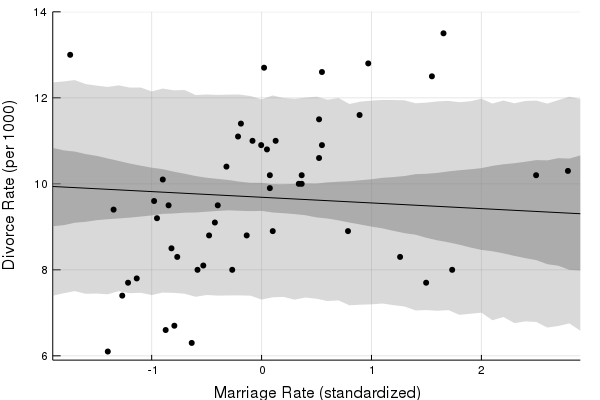

In [186]:
Plots.plot(ws, last.(yis), linealpha = 0.0, fill = (first.(yis), 0.3, :grey))
Plots.plot!(ws, last.(μs_hdpi), linealpha = 0.0, fill = (first.(μs_hdpi), 0.5, :grey))
Plots.plot!(ws, μs_mean, color = :black)
Plots.scatter!(waffle[:MarriageStd], waffle[:Divorce], m=(4.0, :black, stroke(0)), legend = false, xlims = (-1.9, 2.9), ylims = (5.9, 14.0))
ylabel!("Divorce Rate (per 1000)")
xlabel!("Marriage Rate (standardized)")

## Divorce ~ Median Mariage Age

In [187]:
μs = [ link3([s[:,1], s[:,2], s[:,3], s[:,4]], (MedianAgeMarriageStd = w, MarriageStd = 0.0)) for w in ws];

In [188]:
μs_mean = map(mean, μs);

In [189]:
μs_hdpi = map(d -> MCMCChain.hpd(d, alpha=1-0.89), μs);

In [190]:
ys = [rand.(Normal.(link3([s[:,1], s[:,2], s[:,3], s[:,4]], (MedianAgeMarriageStd = w, MarriageStd = 0.0)), s[:,1])) for w in ws];

In [191]:
yis = MCMCChain.hpd.(ys, alpha=1-0.89);

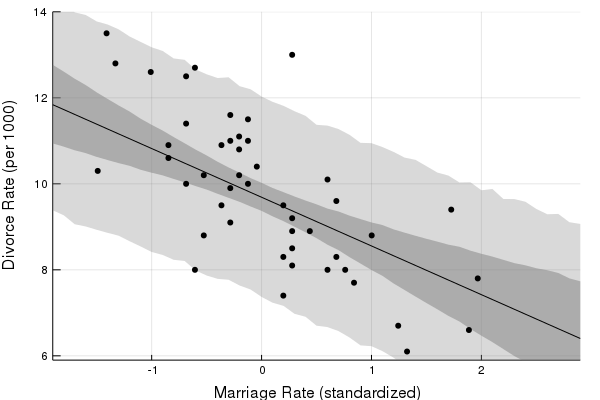

In [192]:
Plots.plot(ws, last.(yis), linealpha = 0.0, fill = (first.(yis), 0.3, :grey))
Plots.plot!(ws, last.(μs_hdpi), linealpha = 0.0, fill = (first.(μs_hdpi), 0.5, :grey))
Plots.plot!(ws, μs_mean, color = :black)
Plots.scatter!(waffle[:MedianAgeMarriageStd], waffle[:Divorce], m=(4.0, :black, stroke(0)), legend = false, xlims = (-1.9, 2.9), ylims = (5.9, 14.0))
ylabel!("Divorce Rate (per 1000)")
xlabel!("Marriage Rate (standardized)")

## Predicted Divorce ~ Observed Divorce

In [193]:
μ = mean(dist3);

In [194]:
predictedDivorce = [ link3(μ, case) for case in eachrow(waffle)];

In [195]:
s = rand(dist3, 10000)';

In [196]:
μs = [ link3([s[:,1], s[:,2], s[:,3], s[:,4]], case) for case in eachrow(waffle)];

In [197]:
μs_mean = map(mean, μs);

In [198]:
μs_hdpi = map(d -> MCMCChain.hpd(d, alpha=1-0.89), μs);

In [199]:
μerr = [abs.((μs_hdpi[i][1], μs_hdpi[i][2]) .- μs_mean[i]) for i in 1:length(μs_hdpi)];

In [200]:
ys = [rand.(Normal.(link3([s[:,1], s[:,2], s[:,3], s[:,4]], case), s[:,1])) for case in eachrow(waffle)];

In [201]:
yis = MCMCChain.hpd.(ys, alpha=(1-0.89)/2);

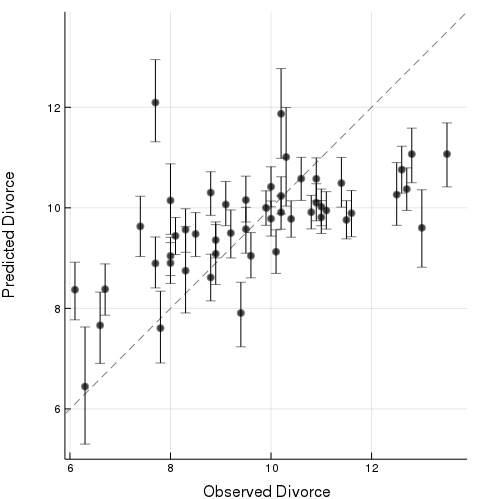

In [202]:
p1 = plot([5.0,14.0], [5.0,14.0], line = (1.0, 1.0, :grey, :dash))
scatter!(waffle[:Divorce], predictedDivorce, yerror = μerr, 
    marker = (4.0, 0.5, :black, stroke(0.5)),
    xlim = (5.9, 13.9), ylim = (5.0, 13.9), legend = false, ratio = 1.0, size = (500, 500))
xlabel!("Observed Divorce")
ylabel!("Predicted Divorce")

In [203]:
predictedDivorceError = waffle[:Divorce] - predictedDivorce;

In [204]:
idx = sortperm(predictedDivorceError);

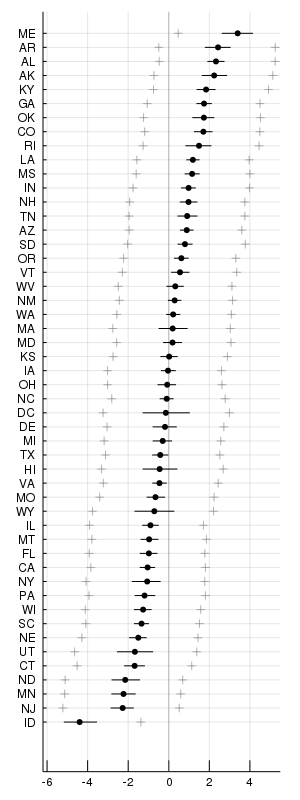

In [205]:
p2 = vline([0], line = (0.5, 0.5, :grey), legend = false, size = (300, 800), yticks = (1:50, waffle[idx, :Loc]), xlim = (-6.2, 5.5), xticks = -6:2:4)
scatter!(predictedDivorceError[idx], 1:50, xerr = μerr[idx], m = (4.0, :black, stroke(0)))
scatter!(waffle[idx, :Divorce] .- first.(yis[idx]), 1:50, m = (4.0, 0.5, :grey, :cross, stroke(0.1)))
scatter!(waffle[idx, :Divorce] .- last.(yis[idx]), 1:50, m = (4.0, 0.5, :grey, :cross, stroke(0.1)))

In [206]:
struct LinModel6 <: Rethinking.Model
    σ_prior
    α_prior
    β_prior
    d
end

In [207]:
link6(p, y) = p[2] .+ p[3] .* y

link6 (generic function with 1 method)

In [208]:
function (m::LinModel6)(p, y)
    logprior_σ = logpdf(m.σ_prior, p[1])
    logprior_α = logpdf(m.α_prior, p[2])
    logprior_β = logpdf(m.β_prior, p[3])
    
    logprior = logprior_σ + logprior_α + logprior_β
    
    if logprior === -Inf
        return logprior
    end
    
    μ = link6(p, y[:WaffleHousesPerCapita])
    
    dlike = Normal.(μ, p[1])
    loglike = sum(logpdf.(dlike, y[:DivorceError]))
    
    loglike + logprior
end

In [209]:
waffleerror = DataFrame(Location = waffle[:Location], Loc = waffle[:Loc], DivorceError = predictedDivorceError, WaffleHousesPerCapita = waffle[:WaffleHouses] ./ waffle[:Population]);

In [210]:
m6 = LinModel6(
    Uniform(0, 10),
    Normal(0, 5),
    Normal(0, 1),
    waffleerror
);

In [211]:
dist6 = Rethinking.map(m6, [5.0, 0.0, 0.0])

FullNormal(
dim: 3
μ: [1.36078, -0.262378, 0.0530813]
Σ: [0.0185172 1.722e-5 -1.34403e-6; 1.722e-5 0.0484618 -0.00232406; -1.34403e-6 -0.00232406 0.000470409]
)


In [212]:
Rethinking.precis(dist6)

p        Mean      StdDev        5.5%       94.5%           1           2           3
1       1.361       0.136       1.143       1.578       1.000   5.748e-04  -4.554e-04 
2      -0.262       0.220      -0.614       0.089   5.748e-04       1.000      -0.487 
3       0.053   2.169e-02   1.842e-02       0.088  -4.554e-04      -0.487       1.000 


In [213]:
μ = mean(dist6);

In [214]:
s = rand(dist6, 10000)';

In [215]:
ws = 0.0:1.0:41;

In [216]:
μs = [ link6([s[:,1], s[:,2], s[:,3]], w) for w in ws];

In [217]:
μs_mean = map(mean, μs);

In [218]:
μs_hdpi = map(d -> MCMCChain.hpd(d, alpha=1-0.89), μs);

In [219]:
ys = [rand.(Normal.(link6([s[:,1], s[:,2], s[:,3]], w), s[:,1])) for w in ws];

In [220]:
yis = MCMCChain.hpd.(ys, alpha=1-0.89);

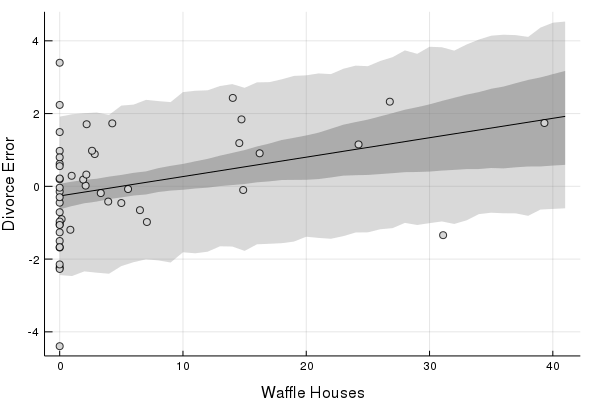

In [221]:
p3 = Plots.plot(ws, last.(yis), linealpha = 0.0, fill = (first.(yis), 0.3, :grey))
Plots.plot!(ws, last.(μs_hdpi), linealpha = 0.0, fill = (first.(μs_hdpi), 0.5, :grey))
Plots.plot!(ws, μs_mean, color = :black)
scatter!(waffleerror[:WaffleHousesPerCapita], waffleerror[:DivorceError], 
    marker = (4.0, 0.8, :white, stroke(1)),
    legend = false)
xlabel!("Waffle Houses")
ylabel!("Divorce Error")

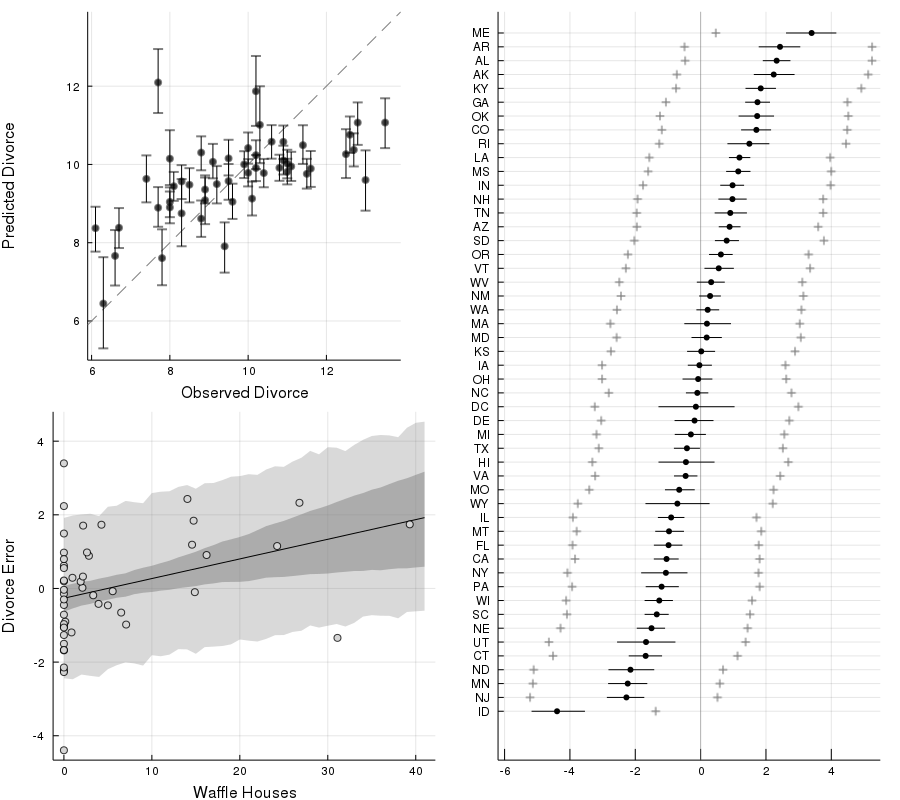

In [222]:
l = @layout [ grid(2,1) a ]
plot(p1, p3, p2, layout = l, size = (900, 800))

## 5.2 Masked Relationships

In [223]:
# download("https://raw.githubusercontent.com/rmcelreath/rethinking/master/data/milk.csv", "milk.csv")

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100  1957  100  1957    0     0   9785      0 --:--:-- --:--:-- --:--:--  9736


"milk.csv"

In [408]:
milk = CSV.read("milk.csv"; delim = ';', allowmissing = :auto, missingstring = "NA");

In [409]:
rename!(milk, Dict(
    Symbol("kcal.per.g") => :kcal,
    Symbol("perc.fat") => :fat,
    Symbol("perc.protein") => :protein,
    Symbol("perc.lactose") => :lactose,
    Symbol("neocortex.perc") => :neocortex,
));

In [410]:
categorical!(milk, :clade);

In [411]:
categorical!(milk, :species);

In [412]:
describe(milk)

,variable,mean,min,median,max,nunique,nmissing,eltype
1,clade,,Ape,,Strepsirrhine,4,,CategoricalString{UInt32}
2,species,,A palliata,,Symphalangus syndactylus,29,,CategoricalString{UInt32}
3,kcal,0.641724,0.46,0.6,0.97,,,Float64
4,fat,33.9903,3.93,36.84,55.51,,,Float64
5,protein,16.4034,7.37,15.8,25.3,,,Float64
6,lactose,49.6062,27.09,48.64,71.91,,,Float64
7,mass,14.7269,0.12,3.47,97.72,,,Float64
8,neocortex,67.5759,55.16,68.85,76.3,,12,Float64


In [774]:
struct LinModel8 <: Rethinking.Model2
    link
    priors
    data
end

In [775]:
function (m::LinModel8)(θ)
    @unpack data, priors, link = m
    α, βn, σ = θ
    
    logprior_α = logpdf(priors[:α], α)
    logprior_β = logpdf(priors[:βn], βn)
    logprior_σ = logpdf(priors[:σ], σ)
    
    logprior = logprior_α + logprior_β + logprior_σ
    
    if logprior === -Inf
        return logprior
    end
    
    μ = link(θ, data)
    
    dlike = Normal(0.0, σ)
    loglike = loglikelihood(dlike, data[:kcal] .- μ)
    
    loglike + logprior
end

In [777]:
m8 = LinModel8(
    function(θ, d) 
        α, βn, σ = θ
        α .+ βn .* d[:neocortex]
    end,
    OrderedDict(
        :α => Normal(0, 100),
        :βn => Normal(0, 1),
        :σ => Uniform(0, 10)
    ),
    dropmissing(milk)
);

In [781]:
dist8 = Rethinking.map(m8)

FullNormal(
dim: 3
μ: [0.353339, 0.0045032, 0.165698]
Σ: [0.221562 -0.00325482 7.02388e-8; -0.00325482 4.81654e-5 -1.04724e-9; 7.02388e-8 -1.04724e-9 0.000807519]
)


In [782]:
Rethinking.precis(dist8, names = string.(keys(m8.priors)))

p         Mean      StdDev        5.5%       94.5%           α          βn           σ
α        0.353       0.471      -0.399       1.106       1.000      -0.996   5.251e-06 
βn   4.503e-03   6.940e-03  -6.588e-03   1.559e-02      -0.996       1.000  -5.310e-06 
σ        0.166   2.842e-02       0.120       0.211   5.251e-06  -5.310e-06       1.000 


In [805]:
xs = 54.0:0.5:77.0;

In [806]:
μs = Rethinking.link(m8, dist8, DataFrame(neocortex = xs));

In [807]:
μs_hdpi = map(d -> MCMCChain.hpd(d, alpha=1-0.89), μs);

In [808]:
μs_mean = mean.(μs);

In [809]:
ys = Rethinking.simulate(m8, dist8, DataFrame(neocortex = xs));

In [810]:
ys_hdpi = map(d -> MCMCChain.hpd(d, alpha=1-0.89), ys);

In [811]:
ys_mean = mean.(ys);

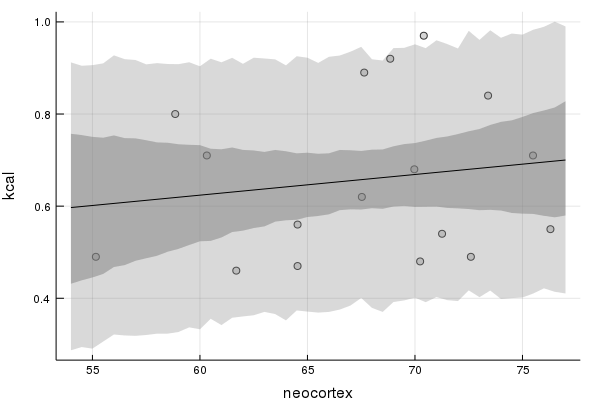

In [812]:
scatter(
    dropmissing(milk)[:neocortex], dropmissing(milk)[:kcal], 
    marker = (4.0, 0.8, :white, stroke(1)),
    legend = false)
plot!(xs, last.(ys_hdpi), linealpha = 0.0, fillrange = first.(ys_hdpi), fill = (0.3, :grey))
plot!(xs, last.(μs_hdpi), linealpha = 0.0, fillrange = first.(μs_hdpi), fill = (0.5, :grey))
plot!(xs, μs_mean, color = :black)
xlabel!("neocortex")
ylabel!("kcal")

In [813]:
m82 = LinModel8(
    function(θ, d) 
        α, βn, σ = θ
        α .+ βn .* log.(d[:mass])
    end,
    OrderedDict(
        :α => Normal(0, 100),
        :βn => Normal(0, 1),
        :σ => Uniform(0, 10)
    ),
    dropmissing(milk)
);

In [814]:
dist82 = Rethinking.map(m82)

FullNormal(
dim: 3
μ: [0.705137, -0.0316745, 0.156858]
Σ: [0.00237211 -0.000616806 -1.81804e-7; -0.000616806 0.000411392 1.20636e-7; -1.81804e-7 1.20636e-7 0.000723662]
)


In [815]:
Rethinking.precis(dist82, names = string.(keys(m8.priors)))

p         Mean      StdDev        5.5%       94.5%           α          βn           σ
α        0.705   4.870e-02       0.627       0.783       1.000      -0.624  -1.388e-04 
βn  -3.167e-02   2.028e-02      -0.064   7.413e-04      -0.624       1.000   2.211e-04 
σ        0.157   2.690e-02       0.114       0.200  -1.388e-04   2.211e-04       1.000 


In [816]:
xs = -2.2:0.1:4.8;

In [817]:
μs = Rethinking.link(m82, dist82, DataFrame(mass = exp.(xs)));

In [818]:
μs_hdpi = map(d -> MCMCChain.hpd(d, alpha=1-0.89), μs);

In [819]:
μs_mean = mean.(μs);

In [820]:
ys = Rethinking.simulate(m82, dist82, DataFrame(mass = exp.(xs)));

In [821]:
ys_hdpi = map(d -> MCMCChain.hpd(d, alpha=1-0.89), ys);

In [822]:
ys_mean = mean.(ys);

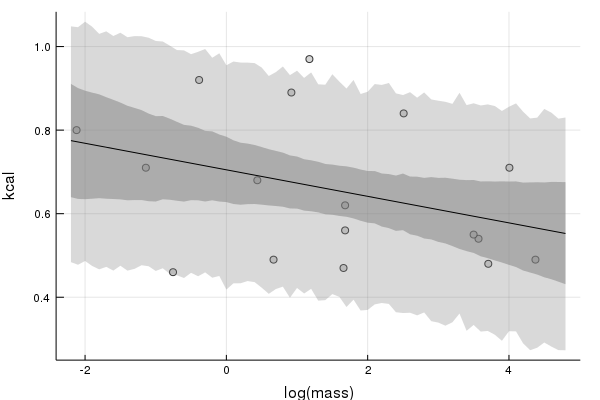

In [823]:
scatter(
    log.(dropmissing(milk)[:mass]), dropmissing(milk)[:kcal], 
    marker = (4.0, 0.8, :white, stroke(1)),
    legend = false)
plot!(xs, last.(ys_hdpi), linealpha = 0.0, fillrange = first.(ys_hdpi), fill = (0.3, :grey))
plot!(xs, last.(μs_hdpi), linealpha = 0.0, fillrange = first.(μs_hdpi), fill = (0.5, :grey))
plot!(xs, μs_mean, color = :black)
xlabel!("log(mass)")
ylabel!("kcal")

In [926]:
struct LinModel9 <: Rethinking.Model2
    link
    priors
    data
end

In [927]:
function (m::LinModel9)(θ)
    @unpack data, priors, link = m
    α, βn, βm, σ = θ
    
    logprior_α = logpdf(priors[:α], α)
    logprior_βn = logpdf(priors[:βn], βn)
    logprior_βm = logpdf(priors[:βm], βm)
    logprior_σ = logpdf(priors[:σ], σ)
    
    logprior = logprior_α + logprior_βn + logprior_βm + logprior_σ
    
    if logprior === -Inf
        return logprior
    end
    
    μ = link(θ, data)
    
    dlike = Normal(0.0, σ)
    loglike = loglikelihood(dlike, data[:kcal] .- μ)
    
    loglike + logprior
end

In [928]:
m9 = LinModel9(
    function(θ, d) 
        α, βn, βm, σ = θ
        α .+ βn .* d[:neocortex] .+ βm .* log.(d[:mass])
    end,
    OrderedDict(
        :α => Normal(0, 100),
        :βn => Normal(0, 1),
        :βm => Normal(0, 1),
        :σ => Uniform(0, 10)
    ),
    dropmissing(milk)
);

In [957]:
dist9 = Rethinking.map(m9)

FullNormal(
dim: 4
μ: [-1.08441, 0.027917, -0.0963494, 0.114786]
Σ: [0.218586 -0.00339011 0.00752273 5.69364e-6; -0.00339011 5.28856e-5 -0.000122508 -9.21587e-8; 0.00752273 -0.000122508 0.00050413 3.56589e-7; 5.69364e-6 -9.21587e-8 3.56589e-7 0.000387523]
)


In [958]:
Rethinking.precis(dist9, names = string.(keys(m9.priors)))

p         Mean      StdDev        5.5%       94.5%           α          βn          βm           σ
α       -1.084       0.468      -1.832      -0.337       1.000      -0.997       0.717   6.186e-04 
βn   2.792e-02   7.272e-03   1.629e-02   3.954e-02      -0.997       1.000      -0.750  -6.438e-04 
βm      -0.096   2.245e-02      -0.132      -0.060       0.717      -0.750       1.000   8.068e-04 
σ        0.115   1.969e-02       0.083       0.146   6.186e-04  -6.438e-04   8.068e-04       1.000 


In [959]:
xs = 54.0:0.5:77.0;

In [960]:
μs = Rethinking.link(m9, dist9, DataFrame(neocortex = xs, mass = mean(log.(dropmissing(milk)[:mass]))) );

In [961]:
μs_hdpi = map(d -> MCMCChain.hpd(d, alpha=1-0.89), μs);

In [962]:
μs_mean = mean.(μs);

In [963]:
ys = Rethinking.simulate(m9, dist9, DataFrame(neocortex = xs, mass = mean(log.(dropmissing(milk)[:mass]))) );

In [964]:
ys_hdpi = map(d -> MCMCChain.hpd(d, alpha=1-0.89), ys);

In [965]:
ys_mean = mean.(ys);

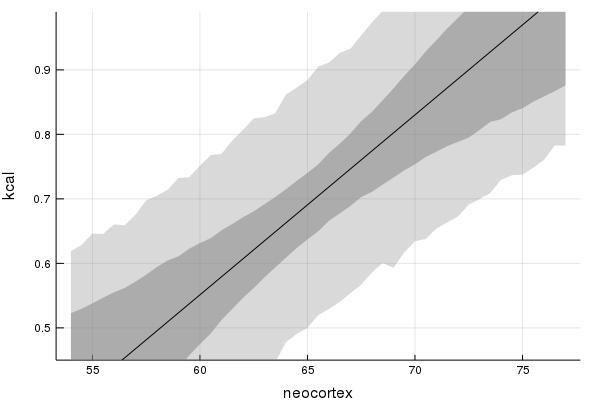

In [966]:
plot(xs, last.(ys_hdpi), linealpha = 0.0, fillrange = first.(ys_hdpi), fill = (0.3, :grey))
plot!(xs, last.(μs_hdpi), linealpha = 0.0, fillrange = first.(μs_hdpi), fill = (0.5, :grey))
plot!(xs, μs_mean, color = :black,
    ylim = (0.45, 0.99),
    legend = false)
xlabel!("neocortex")
ylabel!("kcal")

In [967]:
xs = -2.2:0.1:4.8;

In [968]:
μs = Rethinking.link(m9, dist9, DataFrame(neocortex = mean(dropmissing(milk)[:neocortex]), mass = exp.(xs)) );

In [969]:
μs_hdpi = map(d -> MCMCChain.hpd(d, alpha=1-0.89), μs);

In [970]:
μs_mean = mean.(μs);

In [971]:
ys = Rethinking.simulate(m9, dist9, DataFrame(neocortex = mean(dropmissing(milk)[:neocortex]), mass = exp.(xs)) );

In [972]:
ys_hdpi = map(d -> MCMCChain.hpd(d, alpha=1-0.89), ys);

In [973]:
ys_mean = mean.(ys);

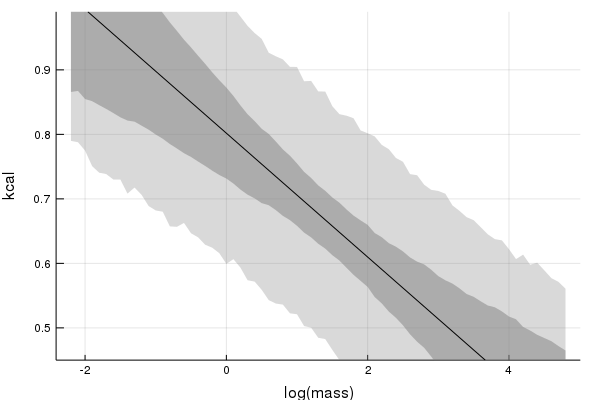

In [975]:
plot(xs, last.(ys_hdpi), linealpha = 0.0, fillrange = first.(ys_hdpi), fill = (0.3, :grey))
plot!(xs, last.(μs_hdpi), linealpha = 0.0, fillrange = first.(μs_hdpi), fill = (0.5, :grey))
plot!(xs, μs_mean, color = :black,
    ylim = (0.45, 0.99),
    legend = false)
xlabel!("log(mass)")
ylabel!("kcal")

## 5.3 When Adding Vaiables Hurts

### Multicollinear legs

In [997]:
N = 100
height = rand(Normal(10, 2), N)
leg_prop = rand(Uniform(0.4, 0.5), N)
leg_left = leg_prop .* height + rand(Normal(0, 0.02), N)
leg_right = leg_prop .* height + rand(Normal(0, 0.02), N)
legs = DataFrame(height = height, leg_left = leg_left, leg_right = leg_right);

In [998]:
struct LinModel10 <: Rethinking.Model2
    link
    priors
    data
end

In [999]:
function (m::LinModel10)(θ)
    @unpack data, priors, link = m
    α, βl, βr, σ = θ
    
    logprior_α = logpdf(priors[:α], α)
    logprior_βl = logpdf(priors[:βl], βl)
    logprior_βr = logpdf(priors[:βr], βr)
    logprior_σ = logpdf(priors[:σ], σ)
    
    logprior = logprior_α + logprior_βl + logprior_βr + logprior_σ
    
    if logprior === -Inf
        return logprior
    end
    
    μ = link(θ, data)
    
    dlike = Normal(0.0, σ)
    loglike = loglikelihood(dlike, data[:height] .- μ)
    
    loglike + logprior
end

In [1000]:
m10 = LinModel10(
    function(θ, d) 
        α, βl, βr, σ = θ
        α .+ βl .* d[:leg_left] .+ βr .* d[:leg_right]
    end,
    OrderedDict(
        :α => Normal(10, 100),
        :βl => Normal(2, 10),
        :βr => Normal(2, 10),
        :σ => Uniform(0, 10)
    ),
    legs
);

In [1001]:
dist10 = Rethinking.map(m10)

FullNormal(
dim: 4
μ: [0.477045, 1.31552, 0.7912, 0.62145]
Σ: [0.110594 0.0646202 -0.0884581 -3.2862e-6; 0.0646202 3.85579 -3.86769 -0.00012694; -0.0884581 -3.86769 3.8849 0.000127596; -3.2862e-6 -0.00012694 0.000127596 0.00193101]
)


In [1002]:
Rethinking.precis(dist10, names = string.(keys(m10.priors)))

p         Mean      StdDev        5.5%       94.5%           α          βl          βr           σ
α        0.477       0.333      -0.054       1.009       1.000       0.099      -0.135  -2.249e-04 
βl       1.316       1.964      -1.823       4.454       0.099       1.000      -0.999  -1.471e-03 
βr       0.791       1.971      -2.359       3.941      -0.135      -0.999       1.000   1.473e-03 
σ        0.621   4.394e-02       0.551       0.692  -2.249e-04  -1.471e-03   1.473e-03       1.000 


In [1014]:
samples = rand(dist10, 10_000);

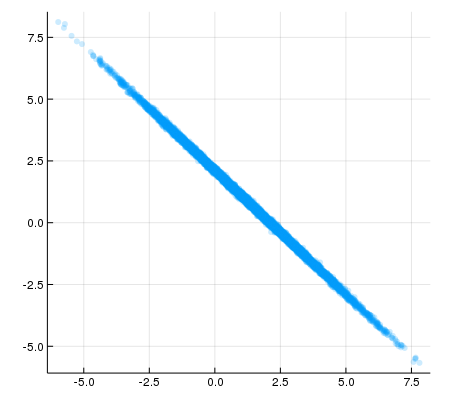

In [1135]:
scatter(samples[2,:], samples[3,:], size = (450, 400), legend = false, markerstrokewidth  = 0.0, markeralpha = 0.2)

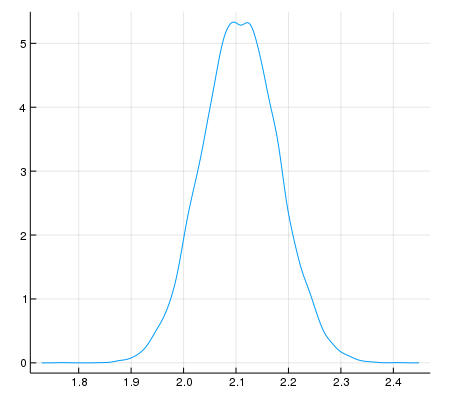

In [1016]:
density(samples[2,:] .+ samples[3,:], size = (450, 400), legend = false)

### Multicollinear milk

In [1126]:
struct LinModel11 <: Rethinking.Model2
    link
    priors
    data
end

In [1127]:
function (m::LinModel11)(θ)
    @unpack data, priors, link = m
    α, βf, βl, σ = θ
    
    logprior_α = logpdf(priors[:α], α)
    logprior_βf = logpdf(priors[:βf], βf)
    logprior_βl = logpdf(priors[:βl], βl)
    logprior_σ = logpdf(priors[:σ], σ)
    
    logprior = logprior_α + logprior_βf + logprior_βl + logprior_σ
    
    if logprior === -Inf
        return logprior
    end
    
    μ = link(θ, data)
    
    dlike = Normal(0.0, σ)
    loglike = loglikelihood(dlike, data[:kcal] .- μ)
    
    loglike + logprior
end

In [1128]:
m11 = LinModel11(
    function(θ, d) 
        α, βf, βl, σ = θ
        α .+ βf .* d[:fat] .+ βl .* d[:lactose]
    end,
    OrderedDict(
        :α => Normal(0.6, 10),
        :βf => Normal(0, 1),
        :βl => Normal(0, 1),
        :σ => Uniform(0, 10)
    ),
    milk
);

In [1021]:
dist11 = Rethinking.map(m11)

FullNormal(
dim: 4
μ: [1.00721, 0.00195439, -0.00870682, 0.0610448]
Σ: [0.0399624 -0.000468595 -0.00048192 -3.4968e-7; -0.000468595 5.7518e-6 5.50515e-6 4.09659e-9; -0.00048192 5.50515e-6 5.94277e-6 4.21992e-9; -3.4968e-7 4.09659e-9 4.21992e-9 6.42489e-5]
)


In [1022]:
Rethinking.precis(dist11, names = string.(keys(m11.priors)))

p         Mean      StdDev        5.5%       94.5%           α          βf          βl           σ
α        1.007       0.200       0.688       1.327       1.000      -0.977      -0.989  -2.182e-04 
βf   1.954e-03   2.398e-03  -1.879e-03   5.787e-03      -0.977       1.000       0.942   2.131e-04 
βl  -8.707e-03   2.438e-03  -1.260e-02  -4.811e-03      -0.989       0.942       1.000   2.160e-04 
σ        0.061   8.016e-03   4.823e-02       0.074  -2.182e-04   2.131e-04   2.160e-04       1.000 


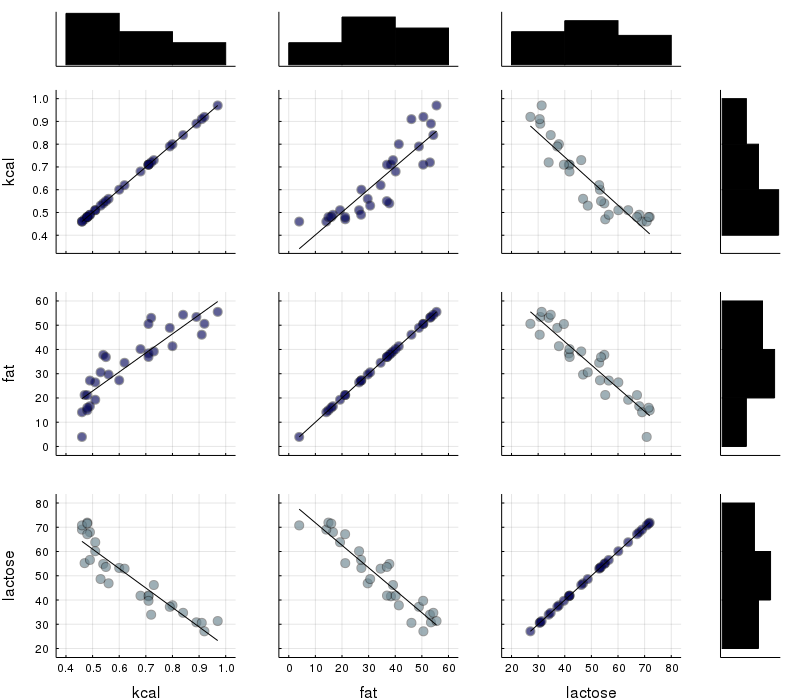

In [1053]:
@df milk cornerplot([:kcal :fat :lactose], grid = false, ms = 5.0, size = (800, 700), markercolor = :blues, markerstrokewidth = 1.0)

## Post Treatment Bias

In [1115]:
N = 100
h0 = rand(Normal(10, 2), N)
treatment = repeat(0:1, inner = Int(N/2))
fungus = rand.(Binomial.(1, 0.5 .- treatment * 0.4))
h1 = h0 .+ rand.(Normal.(5 .- 3 * fungus))

plants = DataFrame(h0 = h0, h1 = h1, treatment = treatment, fungus = fungus);

### With Post Treatment Bias

In [1116]:
struct LinModel12 <: Rethinking.Model2
    link
    priors
    data
end

In [1117]:
function (m::LinModel12)(θ)
    @unpack data, priors, link = m
    α, βh, βt, βf, σ = θ
    
    logprior_α = logpdf(priors[:α], α)
    logprior_βh = logpdf(priors[:βh], βh)
    logprior_βt = logpdf(priors[:βt], βt)
    logprior_βf = logpdf(priors[:βf], βf)
    logprior_σ = logpdf(priors[:σ], σ)
    
    logprior = logprior_α + logprior_βh + logprior_βt + logprior_βf + logprior_σ
    
    if logprior === -Inf
        return logprior
    end
    
    μ = link(θ, data)
    
    dlike = Normal(0.0, σ)
    loglike = loglikelihood(dlike, data[:h1] .- μ)
    
    loglike + logprior
end

In [1118]:
m12 = LinModel12(
    function(θ, d) 
        α, βh, βt, βf, σ = θ
        α .+ βh .* d[:h0] .+ βt .* d[:treatment] .+ βf .* d[:fungus]
    end,
    OrderedDict(
        :α => Normal(0, 100),
        :βh => Normal(0, 10),
        :βt => Normal(0, 10),
        :βf => Normal(0, 10),
        :σ => Uniform(0, 10)
    ),
    plants
);

In [1119]:
dist12 = Rethinking.map(m12)

FullNormal(
dim: 5
μ: [5.97087, 0.92481, -0.306917, -3.03001, 0.95256]
Σ: [0.300919 -0.0275612 … -0.0187807 -5.63954e-6; -0.0275612 0.00284224 … -0.00139684 -5.10873e-7; … ; -0.0187807 -0.00139684 … 0.0680438 2.08947e-5; -5.63954e-6 -5.10873e-7 … 2.08947e-5 0.00453686]
)


In [1120]:
Rethinking.precis(dist12, names = string.(keys(m12.priors)))

p         Mean      StdDev        5.5%       94.5%           α          βh          βt          βf           σ
α        5.971       0.549       5.094       6.848       1.000      -0.942      -0.265      -0.131  -1.526e-04 
βh       0.925       0.053       0.840       1.010      -0.942       1.000  -2.404e-03      -0.100  -1.423e-04 
βt      -0.307       0.225      -0.666       0.052      -0.265  -2.404e-03       1.000       0.528   7.116e-04 
βf      -3.030       0.261      -3.447      -2.613      -0.131      -0.100       0.528       1.000   1.189e-03 
σ        0.953       0.067       0.845       1.060  -1.526e-04  -1.423e-04   7.116e-04   1.189e-03       1.000 


### Without Post Treatment Bias

In [1121]:
struct LinModel13 <: Rethinking.Model2
    link
    priors
    data
end

In [1122]:
function (m::LinModel13)(θ)
    @unpack data, priors, link = m
    α, βh, βt, σ = θ
    
    logprior_α = logpdf(priors[:α], α)
    logprior_βh = logpdf(priors[:βh], βh)
    logprior_βt = logpdf(priors[:βt], βt)
    logprior_σ = logpdf(priors[:σ], σ)
    
    logprior = logprior_α + logprior_βh + logprior_βt + logprior_σ
    
    if logprior === -Inf
        return logprior
    end
    
    μ = link(θ, data)
    
    dlike = Normal(0.0, σ)
    loglike = loglikelihood(dlike, data[:h1] .- μ)
    
    loglike + logprior
end

In [1123]:
m13 = LinModel13(
    function(θ, d) 
        α, βh, βt, σ = θ
        α .+ βh .* d[:h0] .+ βt .* d[:treatment]
    end,
    OrderedDict(
        :α => Normal(0, 100),
        :βh => Normal(0, 10),
        :βt => Normal(0, 10),
        :σ => Uniform(0, 10)
    ),
    plants
);

In [1124]:
dist13 = Rethinking.map(m13)

FullNormal(
dim: 4
μ: [5.13499, 0.862591, 1.07244, 1.46028]
Σ: [0.694951 -0.0656733 -0.0567833 1.0943e-5; -0.0656733 0.00661176 0.00142671 -4.8868e-7; -0.0567833 0.00142671 0.0855321 -1.26596e-5; 1.0943e-5 -4.8868e-7 -1.26596e-5 0.0106621]
)


In [1125]:
Rethinking.precis(dist13, names = string.(keys(m13.priors)))

p         Mean      StdDev        5.5%       94.5%           α          βh          βt           σ
α        5.135       0.834       3.803       6.467       1.000      -0.969      -0.233   1.271e-04 
βh       0.863       0.081       0.733       0.993      -0.969       1.000       0.060  -5.820e-05 
βt       1.072       0.292       0.605       1.540      -0.233       0.060       1.000  -4.192e-04 
σ        1.460       0.103       1.295       1.625   1.271e-04  -5.820e-05  -4.192e-04       1.000 


## 5.4 Categorical Variables

### Two Categories

In [5]:
# download("https://raw.githubusercontent.com/rmcelreath/rethinking/master/data/Howell1.csv", "Howell1.csv")

In [1150]:
howell1 = CSV.read("Howell1.csv"; delim = ';', allowmissing = :none)
# categorical!(howell1, :male)
describe(howell1)

,variable,mean,min,median,max,nunique,nmissing,eltype
1,height,138.264,53.975,148.59,179.07,,,Float64
2,weight,35.6106,4.25242,40.0578,62.9926,,,Float64
3,age,29.3444,0.0,27.0,88.0,,,Float64
4,male,0.472426,0,0.0,1,,,Int64


In [1151]:
struct LinModel15 <: Rethinking.Model2
    link
    priors
    data
end

In [1152]:
function (m::LinModel15)(θ)
    @unpack data, priors, link = m
    α, βm, σ = θ
    
    logprior_α = logpdf(priors[:α], α)
    logprior_βm = logpdf(priors[:βm], βm)
    logprior_σ = logpdf(priors[:σ], σ)
    
    logprior = logprior_α + logprior_βm + logprior_σ
    
    if logprior === -Inf
        return logprior
    end
    
    μ = link(θ, data)
    
    dlike = Normal(0.0, σ)
    loglike = loglikelihood(dlike, data[:height] .- μ)
    
    loglike + logprior
end

In [1153]:
m15 = LinModel15(
    function(θ, d) 
        α, βm, σ = θ
        α .+ βm .* d[:male]
    end,
    OrderedDict(
        :α => Normal(178, 100),
        :βm => Normal(0, 10),
        :σ => Uniform(0, 50)
    ),
    howell1
);

In [1156]:
dist15 = Rethinking.map(m15)

FullNormal(
dim: 3
μ: [134.831, 7.27915, 27.3092]
Σ: [2.53386 -2.46241 0.00944207; -2.46241 5.21316 -0.0193365; 0.00944207 -0.0193365 0.685545]
)


In [1157]:
Rethinking.precis(dist15, names = string.(keys(m15.priors)))

p         Mean      StdDev        5.5%       94.5%           α          βm           σ
α      134.831       1.592     132.287     137.375       1.000      -0.678   7.164e-03 
βm       7.279       2.283       3.630      10.928      -0.678       1.000  -1.023e-02 
σ       27.309       0.828      25.986      28.633   7.164e-03  -1.023e-02       1.000 


In [1158]:
struct LinModel16 <: Rethinking.Model2
    link
    priors
    data
end

In [1159]:
function (m::LinModel16)(θ)
    @unpack data, priors, link = m
    αf, αm, σ = θ
    
    logprior_αf = logpdf(priors[:αf], αf)
    logprior_αm = logpdf(priors[:αm], αm)
    logprior_σ = logpdf(priors[:σ], σ)
    
    logprior = logprior_αf + logprior_αm + logprior_σ
    
    if logprior === -Inf
        return logprior
    end
    
    μ = link(θ, data)
    
    dlike = Normal(0.0, σ)
    loglike = loglikelihood(dlike, data[:height] .- μ)
    
    loglike + logprior
end

In [1164]:
m16 = LinModel16(
    function(θ, d) 
        αf, αm, σ = θ
        αf * (1 .- d[:male]) .+ αm * d[:male]
    end,
    OrderedDict(
        :αf => Normal(178, 100),
        :αm => Normal(178, 100),
        :σ => Uniform(0, 50)
    ),
    howell1
);

In [1165]:
dist16 = Rethinking.map(m16)

FullNormal(
dim: 3
μ: [134.642, 142.331, 27.3085]
Σ: [2.59777 4.35493e-7 0.000572046; 4.35493e-7 2.90092 0.000521814; 0.000572046 0.000521814 0.685434]
)


In [1166]:
Rethinking.precis(dist16, names = string.(keys(m16.priors)))

p         Mean      StdDev        5.5%       94.5%          αf          αm           σ
αf     134.642       1.612     132.066     137.217       1.000   1.586e-07   4.287e-04 
αm     142.331       1.703     139.609     145.053   1.586e-07       1.000   3.701e-04 
σ       27.308       0.828      25.985      28.632   4.287e-04   3.701e-04       1.000 


### Many Categories

In [1167]:
milk = CSV.read("milk.csv"; delim = ';', allowmissing = :auto, missingstring = "NA");

In [1168]:
rename!(milk, Dict(
    Symbol("kcal.per.g") => :kcal,
    Symbol("perc.fat") => :fat,
    Symbol("perc.protein") => :protein,
    Symbol("perc.lactose") => :lactose,
    Symbol("neocortex.perc") => :neocortex,
));

In [1169]:
categorical!(milk, :clade);
categorical!(milk, :species);

In [1178]:
milk[:clade]

29-element CategoricalArray{String,1,UInt32}:
 "Strepsirrhine"   
 "Strepsirrhine"   
 "Strepsirrhine"   
 "Strepsirrhine"   
 "Strepsirrhine"   
 "New World Monkey"
 "New World Monkey"
 "New World Monkey"
 "New World Monkey"
 "New World Monkey"
 "New World Monkey"
 "New World Monkey"
 "New World Monkey"
 "New World Monkey"
 "Old World Monkey"
 "Old World Monkey"
 "Old World Monkey"
 "Old World Monkey"
 "Old World Monkey"
 "Old World Monkey"
 "Ape"             
 "Ape"             
 "Ape"             
 "Ape"             
 "Ape"             
 "Ape"             
 "Ape"             
 "Ape"             
 "Ape"             

In [1170]:
describe(milk)

,variable,mean,min,median,max,nunique,nmissing,eltype
1,clade,,Ape,,Strepsirrhine,4,,CategoricalString{UInt32}
2,species,,A palliata,,Symphalangus syndactylus,29,,CategoricalString{UInt32}
3,kcal,0.641724,0.46,0.6,0.97,,,Float64
4,fat,33.9903,3.93,36.84,55.51,,,Float64
5,protein,16.4034,7.37,15.8,25.3,,,Float64
6,lactose,49.6062,27.09,48.64,71.91,,,Float64
7,mass,14.7269,0.12,3.47,97.72,,,Float64
8,neocortex,67.5759,55.16,68.85,76.3,,12,Float64


In [1180]:
struct LinModel17 <: Rethinking.Model2
    link
    priors
    data
end

In [1187]:
function (m::LinModel17)(θ)
    @unpack data, priors, link = m
    α, βNWM, βOWM, βS, σ = θ
    
    logprior_α = logpdf(priors[:α], α)
    logprior_βNWM = logpdf(priors[:βNWM], βNWM)
    logprior_βOWM = logpdf(priors[:βOWM], βOWM)
    logprior_βS = logpdf(priors[:βS], βS)
    logprior_σ = logpdf(priors[:σ], σ)
    
    logprior = logprior_α + logprior_βNWM + logprior_βOWM + logprior_βS + logprior_σ
    
    if logprior === -Inf
        return logprior
    end
    
    μ = link(θ, data)
    
    dlike = Normal(0.0, σ)
    loglike = loglikelihood(dlike, data[:kcal] .- μ)
    
    loglike + logprior
end

In [1209]:
m17 = LinModel17(
    function(θ, d) 
        α, βNWM, βOWM, βS, σ = θ
        α .+ βNWM .* (d[:clade] .== "New World Monkey") .+ βOWM .* (d[:clade] .== "Old World Monkey") .+ βS .* (d[:clade] .== "Strepsirrhine")
    end,
    OrderedDict(
        :α => Normal(0.6, 10),
        :βNWM => Normal(0, 1),
        :βOWM => Normal(0, 1),
        :βS => Normal(0, 1),
        :σ => Uniform(0, 10)
    ),
    milk
);

In [1210]:
dist17 = Rethinking.map(m17)

FullNormal(
dim: 5
μ: [0.546098, 0.168102, 0.241707, -0.0379983, 0.114502]
Σ: [0.00145043 -0.00144833 … -0.00144663 2.12857e-6; -0.00144833 0.00290087 … 0.00144453 -3.091e-6; … ; -0.00144663 0.00144453 … 0.00405814 -1.73063e-6; 2.12857e-6 -3.091e-6 … -1.73063e-6 0.000226053]
)


In [1211]:
Rethinking.precis(dist17, names = string.(keys(m17.priors)))

p           Mean      StdDev        5.5%       94.5%           α        βNWM        βOWM          βS           σ
α          0.546   3.808e-02       0.485       0.607       1.000      -0.706      -0.631      -0.596   3.717e-03 
βNWM       0.168       0.054       0.082       0.254      -0.706       1.000       0.446       0.421  -3.817e-03 
βOWM       0.242       0.060       0.145       0.338      -0.631       0.446       1.000       0.376  -4.645e-03 
βS    -3.800e-02       0.064      -0.140       0.064      -0.596       0.421       0.376       1.000  -1.807e-03 
σ          0.115   1.504e-02       0.090       0.139   3.717e-03  -3.817e-03  -4.645e-03  -1.807e-03       1.000 


In [1212]:
postsample = rand(dist17, 10_000);

In [1213]:
μ_ape = postsample[1, :]
μ_nwm = postsample[1, :] .+ postsample[2, :]
μ_owm = postsample[1, :] .+ postsample[3, :]
μ_s   = postsample[1, :] .+ postsample[4, :]
;

In [1214]:
milk2 = DataFrame(μ_ape=μ_ape, μ_nwm=μ_nwm, μ_owm=μ_owm, μ_s=μ_s);

In [1215]:
describe(milk2)

,variable,mean,min,median,max,nunique,nmissing,eltype
1,μ_ape,0.546172,0.406474,0.546121,0.689999,,,Float64
2,μ_nwm,0.714106,0.582386,0.714227,0.859767,,,Float64
3,μ_owm,0.787886,0.617081,0.788239,0.959527,,,Float64
4,μ_s,0.508159,0.306219,0.508664,0.714961,,,Float64


In [1216]:
diff_nwm_owm = milk2[:μ_nwm] - milk2[:μ_owm];

In [1217]:
quantile(diff_nwm_owm, [0.025, 0.5, 0.975])

3-element Array{Float64,1}:
 -0.19355392657552586 
 -0.07313896549381499 
  0.043791576237551914

In [1224]:
struct LinModel18 <: Rethinking.Model2
    link
    priors
    data
end

In [1225]:
function (m::LinModel18)(θ)
    @unpack data, priors, link = m
    αA, αNWM, αOWM, αS, σ = θ
    
    logprior_αA = logpdf(priors[:α], αA)
    logprior_αNWM = logpdf(priors[:α], αNWM)
    logprior_αOWM = logpdf(priors[:α], αOWM)
    logprior_αS = logpdf(priors[:α], αS)
    logprior_σ = logpdf(priors[:σ], σ)
    
    logprior = logprior_αA + logprior_αNWM + logprior_αOWM + logprior_αS + logprior_σ
    
    if logprior === -Inf
        return logprior
    end
    
    μ = link(θ, data)
    
    dlike = Normal(0.0, σ)
    loglike = loglikelihood(dlike, data[:kcal] .- μ)
    
    loglike + logprior
end

In [1232]:
m18 = LinModel18(
    function(θ, d) 
        αA, αNWM, αOWM, αS, σ = θ
        αA .* (d[:clade] .== "Ape") .+ 
            αNWM .* (d[:clade] .== "New World Monkey") .+ 
            αOWM .* (d[:clade] .== "Old World Monkey") .+ 
            αS .* (d[:clade] .== "Strepsirrhine")
    end,
    OrderedDict(
        :α => Normal(0.6, 10),
        :σ => Uniform(0, 10)
    ),
    milk
);

In [1233]:
dist18 = Rethinking.map(m18, [0.6, 0.6, 0.6, 0.6, 5.0])

FullNormal(
dim: 5
μ: [0.545556, 0.714443, 0.788329, 0.508002, 0.114502]
Σ: [0.00145671 -9.11135e-14 … 1.31849e-13 3.12652e-9; -9.11135e-14 0.00145671 … -2.77825e-13 -6.58802e-9; … ; 1.31849e-13 -2.77825e-13 … 0.00262205 9.53258e-9; 3.12652e-9 -6.58802e-9 … 9.53258e-9 0.000226044]
)


In [1234]:
Rethinking.precis(dist18, names = ["αA", "αNWM", "αOWM", "αS", "σ"])

p           Mean      StdDev        5.5%       94.5%          αA        αNWM        αOWM          αS           σ
αA         0.546   3.817e-02       0.485       0.607       1.000  -6.255e-11   4.309e-08   6.746e-11   5.448e-06 
αNWM       0.714   3.817e-02       0.653       0.775  -6.255e-11       1.000   1.299e-07  -1.422e-10  -1.148e-05 
αOWM       0.788   4.674e-02       0.714       0.863   4.309e-08   1.299e-07       1.000  -2.864e-10  -2.313e-05 
αS         0.508       0.051       0.426       0.590   6.746e-11  -1.422e-10  -2.864e-10       1.000   1.238e-05 
σ          0.115   1.503e-02       0.090       0.139   5.448e-06  -1.148e-05  -2.313e-05   1.238e-05       1.000 
